<a href="https://colab.research.google.com/github/diegojeda/Bit-Optimization-ML/blob/master/Pruebas%20de%20Modelos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import numpy as np
from numpy import loadtxt
from pylab import *
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from IPython.core.interactiveshell import InteractiveShell  
InteractiveShell.ast_node_interactivity = "all"
from IPython.display import display, HTML
import pandas as pd
from scipy import stats
import pandas_profiling
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os
import missingno as msno
from pycaret.regression import *
from sklearn.model_selection import train_test_split
import math
from pandas_profiling import ProfileReport
import dtale
from itertools import product
import plotly.graph_objects as go
plt.style.use('ggplot');

In [2]:
url = "https://raw.githubusercontent.com/diegojeda/Curso-Analytics---Drilling-Bits/master/BLCat.csv"

base = pd.read_csv(url,error_bad_lines=False)

In [3]:
base

,Unnamed: 0,Well,Size,Bit_Number,Re_Run,Reference,Type,Structure,Formation,Footage,...,Min WOB,Max WOB,ROP,Mud Weight,Drive_System,Min_RPM,Max_RPM,Torque Max,Torque Min,Manufacturer
0,0,Florida 7,36.0,1,N,L3A,Tricone,Anticlinal N,C5,82.0,...,5.000000,13.0,10.10,8.5,Rotary,60.0,80.0,5.0,3.0,Varel
1,1,Florida 7,26.0,2,N,T43,Tricone,Anticlinal N,C5,15.0,...,18.000000,23.0,8.30,8.5,Rotary,48.0,48.0,15.0,2.0,Hycalog
2,2,Florida 7,26.0,2,R,T43,Tricone,Anticlinal N,C5,709.0,...,25.000000,78.0,11.29,8.5,RSS,47.0,73.0,15.0,2.0,Hycalog
3,3,Florida 7,26.0,2,R,T43,Tricone,Anticlinal N,C6,547.0,...,25.000000,78.0,11.29,8.5,RSS,47.0,73.0,15.0,2.0,Hycalog
4,4,Florida 7,26.0,3,N,GTX-CM03,Tricone,Anticlinal N,C6,438.0,...,40.000000,55.0,14.32,9.6,RSS,144.0,168.0,15.0,2.0,Hughes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
207,207,Florida 9,8.5,19,N,FX74D,PDC,Anticlinal F,Guadalupe,219.0,...,15.000000,30.0,6.10,8.2,Rotary,90.0,120.0,8.0,6.0,Halliburton
208,208,Florida 9,8.5,20,N,Q408FX,PDC,Anticlinal F,Guadalupe,97.0,...,9.500000,45.0,2.50,8.2,Rotary,78.0,115.0,9.0,7.0,Hughes
209,209,Florida 9,8.5,21,N,MDSi813,PDC,Anticlinal F,Guadalupe,198.0,...,5.000000,35.0,4.00,8.3,Rotary,90.0,130.0,9.0,7.0,Smith
210,210,Florida 9,8.5,22,N,MDSi813,PDC,Anticlinal F,Guadalupe,56.0,...,9.500000,30.0,5.00,8.4,Rotary,50.0,135.0,8.5,7.0,Smith


Procederemos a trabajar con las medias de los rangos de los parametros, con el fin de reducir dimensiones y simplificar el modelo.

In [4]:
base.columns

Index(['Unnamed: 0', 'Well', 'Size', 'Bit_Number', 'Re_Run', 'Reference',
       'Type', 'Structure', 'Formation', 'Footage', 'Depth in', 'Depth out',
       'Depth Average', 'Blades', 'Cutter size', 'Min Flow Rate',
       'Max Flow Rate', 'TFA', 'HSI', 'Min WOB', 'Max WOB', 'ROP',
       'Mud Weight', 'Drive_System', 'Min_RPM', 'Max_RPM', 'Torque Max',
       'Torque Min', 'Manufacturer'],
      dtype='object')

In [5]:
base["Flow Rate"] = base[["Min Flow Rate","Max Flow Rate"]].mean(axis=1)
base["RPM"] = base[["Min_RPM","Max_RPM"]].mean(axis=1)
base["Torque"] = base[["Torque Min","Torque Max"]].mean(axis=1)
base["WOB"] = base[["Min WOB","Max WOB"]].mean(axis=1)

In [6]:
base=base.drop(["Unnamed: 0","Min Flow Rate","Max Flow Rate","Min_RPM","Max_RPM","Torque Min","Torque Max","Min WOB","Max WOB"],axis=1)

In [7]:
base.columns

Index(['Well', 'Size', 'Bit_Number', 'Re_Run', 'Reference', 'Type',
       'Structure', 'Formation', 'Footage', 'Depth in', 'Depth out',
       'Depth Average', 'Blades', 'Cutter size', 'TFA', 'HSI', 'ROP',
       'Mud Weight', 'Drive_System', 'Manufacturer', 'Flow Rate', 'RPM',
       'Torque', 'WOB'],
      dtype='object')

In [8]:
base.Manufacturer.unique()

array(['Varel', 'Hycalog', 'Hughes', 'Security', 'Smith', 'Halliburton'],
      dtype=object)

In [9]:
base.loc[base["Manufacturer"]=="Halliburton","Manufacturer"]="Man 1"
base.loc[base["Manufacturer"]=="Hughes","Manufacturer"]="Man 2"
base.loc[base["Manufacturer"]=="Hycalog","Manufacturer"]="Man 3"
base.loc[base["Manufacturer"]=="Security","Manufacturer"]="Man 4"
base.loc[base["Manufacturer"]=="Smith","Manufacturer"]="Man 5"
base.loc[base["Manufacturer"]=="Varel","Manufacturer"]="Man 6"

In [10]:
base.Manufacturer.unique()

array(['Man 6', 'Man 3', 'Man 2', 'Man 4', 'Man 5', 'Man 1'], dtype=object)

In [11]:
profile = ProfileReport(base, title="Pandas Profiling Report")

In [12]:
profile = ProfileReport(base, title='Pandas Profiling Report', explorative=True)

In [13]:
profile

In [14]:
d = dtale.show(base)
dtale.show(base, ignore_duplicate=True)

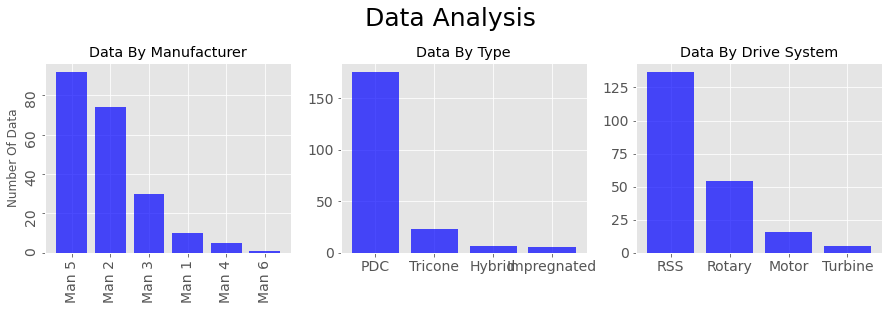

In [15]:
# Se crean las tablas, sumando los valores que se tienen para cada categoria
man = pd.DataFrame(base["Manufacturer"].value_counts())
typ = pd.DataFrame(base["Type"].value_counts())
drive = pd.DataFrame(base["Drive_System"].value_counts())

# Grafica Registro Wireline
fig = plt.figure(figsize=(15, 3.5))
fig.subplots_adjust(wspace=0.2)
fig.suptitle("Data Analysis",fontsize=25,y=1.1)

# Creamos los plots
ax1 = fig.add_subplot(131)
ax2 = fig.add_subplot(132)
ax3 = fig.add_subplot(133)

# Graficamos cada track de datos
ax1.bar(man.index,man.Manufacturer, alpha=0.7,color="blue")
ax2.bar(typ.index,typ.Type,alpha=0.7,color="blue")
ax3.bar(drive.index,drive.Drive_System, alpha=0.7,color="blue")

# Colocamos los titulos
ax1.set_title('Data By Manufacturer')
ax2.set_title('Data By Type')
ax3.set_title('Data By Drive System')
ax1.set_ylabel('Number Of Data')

ax1.tick_params(labelrotation=90,labelsize=14)
ax2.tick_params(labelsize=14)
ax3.tick_params(labelsize=14);

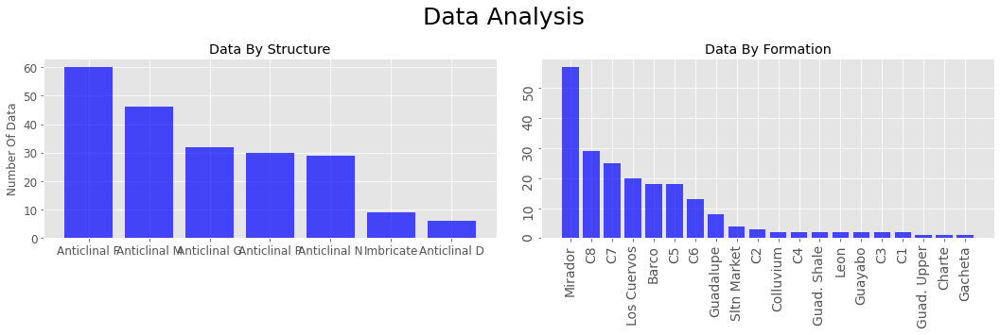

In [16]:
# Se crean las tablas, sumando los valores que se tienen para cada categoria
stru = pd.DataFrame(base["Structure"].value_counts())
form = pd.DataFrame(base["Formation"].value_counts())

# Grafica Registro Wireline
fig = plt.figure(figsize=(18, 3.5))
fig.subplots_adjust(wspace=0.1)
fig.suptitle("Data Analysis",fontsize=25,y=1.1)

# Creamos los plots
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)

# Graficamos cada track de datos
ax1.bar(stru.index,stru.Structure, alpha=0.7,color="blue")
ax2.bar(form.index,form.Formation,alpha=0.7,color="blue")

# Colocamos los titulos
ax1.set_title('Data By Structure')
ax2.set_title('Data By Formation')
ax1.set_ylabel('Number Of Data')

ax1.tick_params(labelsize=12)
ax2.tick_params(labelrotation=90,labelsize=14);

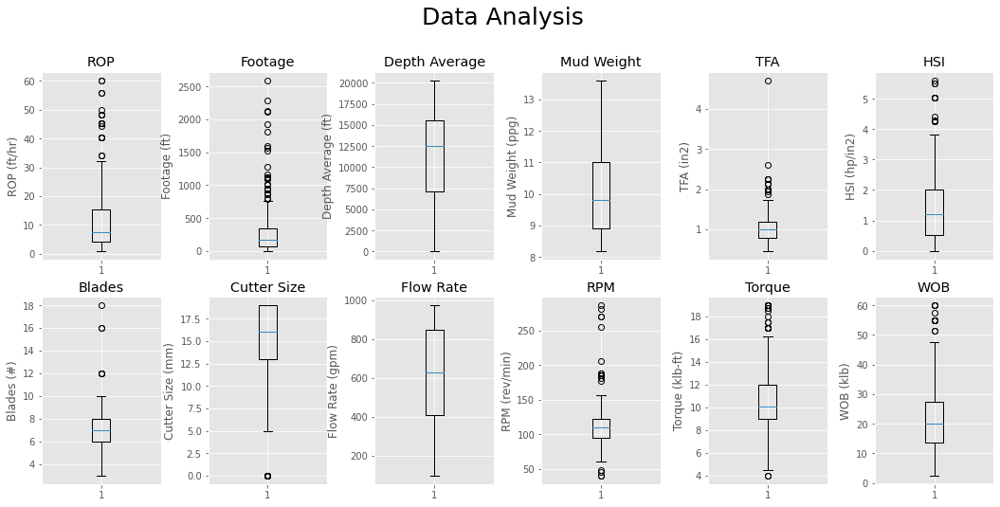

In [17]:
# Grafica
fig = plt.figure(figsize=(18,8))
fig.subplots_adjust(wspace=0.4)
fig.suptitle("Data Analysis",fontsize=25,y=1.0)

# Creamos los plots
ax1 = fig.add_subplot(261)
ax2 = fig.add_subplot(262)
ax3 = fig.add_subplot(263)
ax4 = fig.add_subplot(264)
ax5 = fig.add_subplot(265)
ax6 = fig.add_subplot(266)
ax7 = fig.add_subplot(267)
ax8 = fig.add_subplot(268)
ax9 = fig.add_subplot(269)
ax10 = fig.add_subplot(2,6,10)
ax11 = fig.add_subplot(2,6,11)
ax12 = fig.add_subplot(2,6,12)

# Graficamos cada track de datos
ax1.boxplot(base.ROP)
ax2.boxplot(base.Footage)
ax3.boxplot(base["Depth Average"])
ax4.boxplot(base["Mud Weight"])
ax5.boxplot(base.TFA)
ax6.boxplot(base.HSI)

ax7.boxplot(base.Blades)
ax8.boxplot(base["Cutter size"])
ax9.boxplot(base["Flow Rate"])
ax10.boxplot(base["RPM"])
ax11.boxplot(base["Torque"])
ax12.boxplot(base["WOB"])

# Colocamos los titulos
ax1.set_title('ROP')
ax1.set_ylabel('ROP (ft/hr)')
ax2.set_title('Footage')
ax2.set_ylabel('Footage (ft)')
ax3.set_title('Depth Average')
ax3.set_ylabel('Depth Average (ft)')
ax4.set_title('Mud Weight')
ax4.set_ylabel('Mud Weight (ppg)')
ax5.set_title('TFA')
ax5.set_ylabel('TFA (in2)')
ax6.set_title('HSI')
ax6.set_ylabel('HSI (hp/in2)')
ax7.set_title('Blades')
ax7.set_ylabel('Blades (#)')
ax8.set_title('Cutter Size')
ax8.set_ylabel('Cutter Size (mm)')
ax9.set_title('Flow Rate')
ax9.set_ylabel('Flow Rate (gpm)')
ax10.set_title('RPM')
ax10.set_ylabel('RPM (rev/min)')
ax11.set_title('Torque')
ax11.set_ylabel('Torque (klb-ft)')
ax12.set_title('WOB')
ax12.set_ylabel('WOB (klb)');

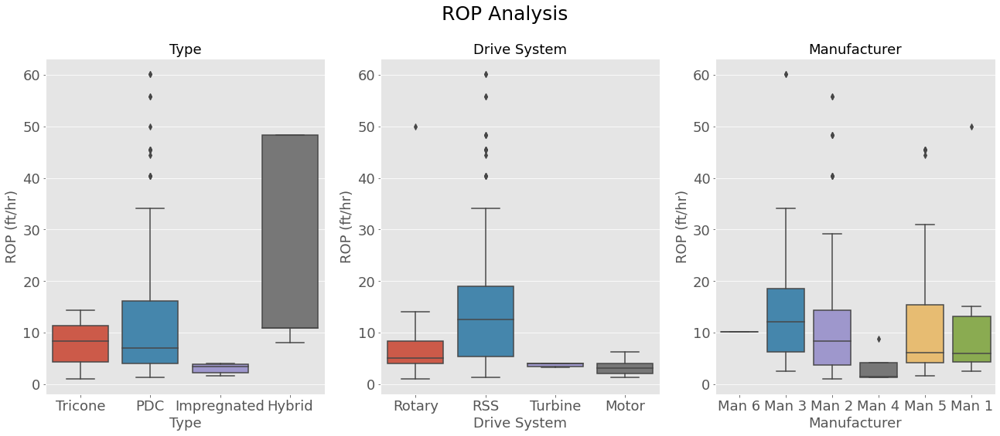

In [18]:
# Creamos la figura y los ejes
fig, axes = plt.subplots(1, 3, figsize=(22, 8), sharey=False)
fig.suptitle('ROP Analysis', fontsize=25,y=1)

sns.boxplot(ax=axes[0], y=base.ROP, x=base.Type)
axes[0].set_title("Type",fontsize=18)
axes[0].tick_params(labelsize=18)
axes[0].set_ylabel('ROP (ft/hr)',fontsize=18)
axes[0].set_xlabel('Type',fontsize=18)


sns.boxplot(ax=axes[1], y=base.ROP, x=base.Drive_System)
axes[1].set_title("Drive System",fontsize=18)
axes[1].tick_params(labelsize=18)
axes[1].set_ylabel('ROP (ft/hr)',fontsize=18)
axes[1].set_xlabel('Drive System',fontsize=18)

sns.boxplot(ax=axes[2], y=base.ROP, x=base.Manufacturer)
axes[2].set_title("Manufacturer",fontsize=18)
axes[2].tick_params(labelsize=18)
axes[2].set_ylabel('ROP (ft/hr)',fontsize=18)
axes[2].set_xlabel('Manufacturer',fontsize=18);

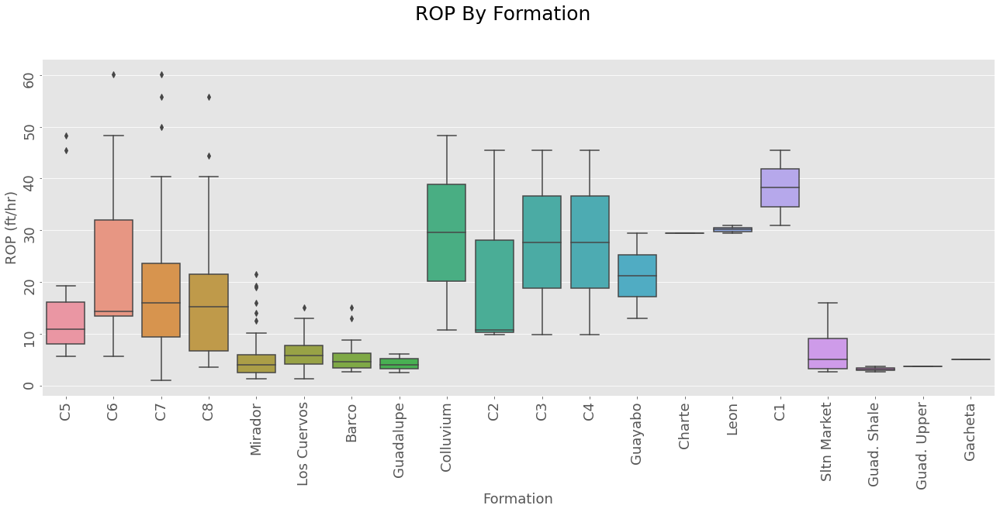

In [19]:
# Grafica
fig = plt.figure(figsize=(22, 8))
fig.subplots_adjust(wspace=0.3)
fig.suptitle("ROP By Formation",fontsize=25,y=1)
bplot=sns.boxplot(y='ROP', x='Formation',data=base)

# Colocamos los titulos
bplot.set_ylabel('ROP (ft/hr)',fontsize=18)
bplot.set_xlabel('Formation',fontsize=18)

bplot.tick_params(labelrotation=90,labelsize=18);

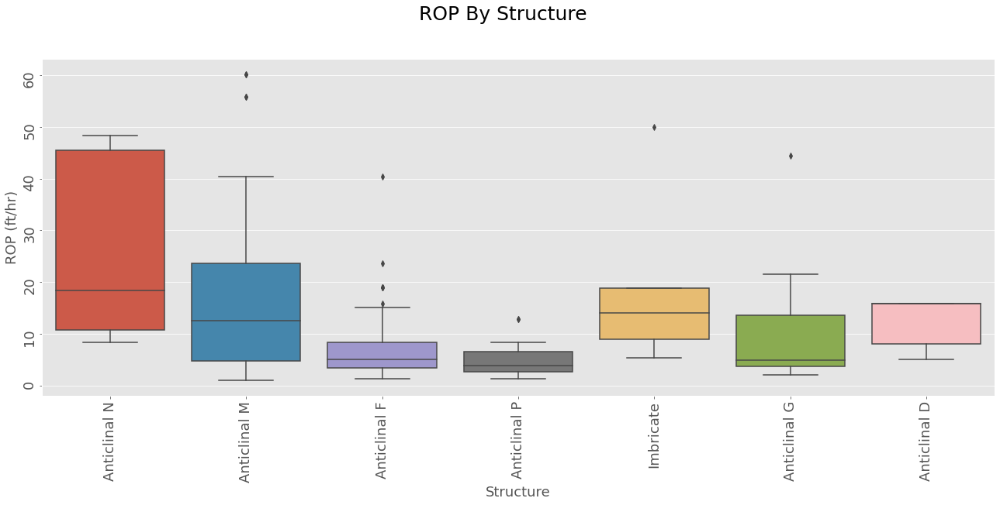

In [20]:
# Grafica
fig = plt.figure(figsize=(22, 8))
fig.subplots_adjust(wspace=0.3)
fig.suptitle("ROP By Structure",fontsize=25,y=1)
bplot=sns.boxplot(y='ROP', x='Structure',data=base)

# Colocamos los titulos
bplot.set_ylabel('ROP (ft/hr)',fontsize=18)
bplot.set_xlabel('Structure',fontsize=18)

bplot.tick_params(labelrotation=90,labelsize=18);

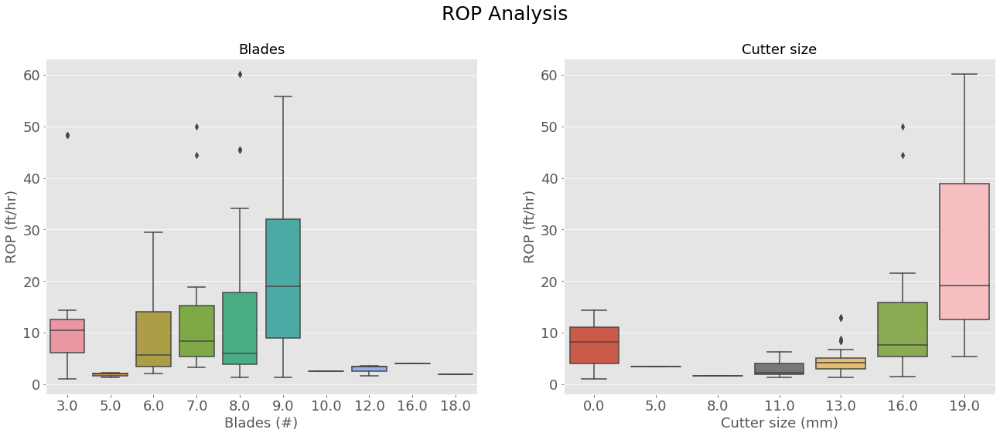

In [21]:
# Creamos la figura y los ejes
fig, axes = plt.subplots(1, 2, figsize=(22, 8), sharey=False)
fig.suptitle('ROP Analysis', fontsize=25,y=1)

sns.boxplot(ax=axes[0], y=base.ROP, x=base.Blades)
axes[0].set_title("Blades",fontsize=18)
axes[0].set_ylabel('ROP (ft/hr)',fontsize=18)
axes[0].set_xlabel('Blades (#)',fontsize=18)
axes[0].tick_params(labelsize=18)

sns.boxplot(ax=axes[1], y=base.ROP, x=base["Cutter size"])
axes[1].set_title("Cutter size",fontsize=18)
axes[1].set_xlabel('Cutter size (mm)',fontsize=18)
axes[1].set_ylabel('ROP (ft/hr)',fontsize=18)
axes[1].tick_params(labelsize=18);

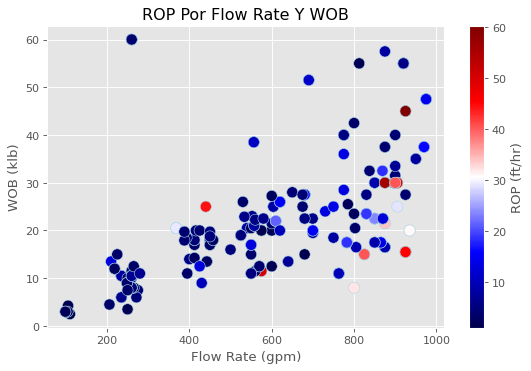

In [22]:
plt.figure(figsize=(8, 5), dpi=80)
plt.scatter(base["Flow Rate"],base["WOB"],s=100,c=base["ROP"],cmap='seismic',edgecolors='lightblue')
plt.title('ROP Por Flow Rate Y WOB')
plt.xlabel("Flow Rate (gpm)")
plt.ylabel("WOB (klb)")
clb = plt.colorbar()
clb.set_label("ROP (ft/hr)");

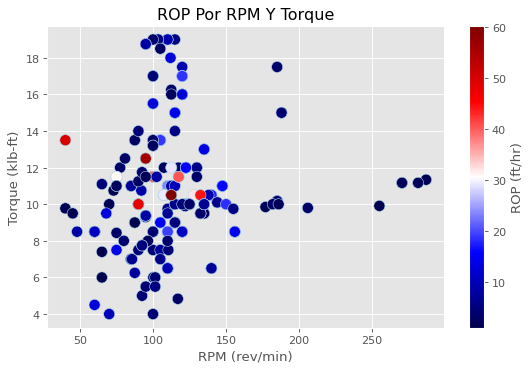

In [23]:
plt.figure(figsize=(8, 5), dpi=80)
plt.scatter(base["RPM"],base["Torque"],s=100,c=base["ROP"],cmap='seismic',edgecolors='lightblue')
plt.title('ROP Por RPM Y Torque')
plt.xlabel("RPM (rev/min)")
plt.ylabel("Torque (klb-ft)")
clb = plt.colorbar()
clb.set_label("ROP (ft/hr)");

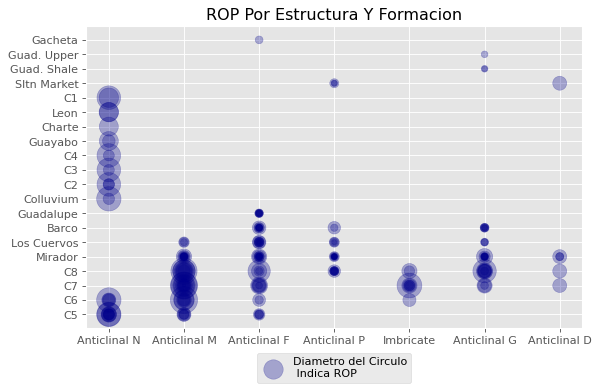

In [24]:
plt.figure(figsize=(8, 5), dpi=80)
plt.scatter(base.Structure,base.Formation,s=10*base["ROP"],c="darkblue",alpha=0.3,label="Diametro del Circulo\n Indica ROP")
plt.title('ROP Por Estructura Y Formacion')
plt.legend(loc='lower center', bbox_to_anchor=(0.5, -0.2));

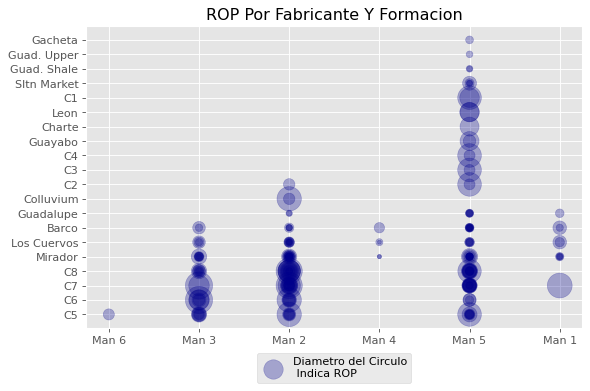

In [25]:
plt.figure(figsize=(8, 5), dpi=80)
plt.scatter(base.Manufacturer,base.Formation,s=10*base["ROP"],c="darkblue",alpha=0.3,label="Diametro del Circulo\n Indica ROP")
plt.title('ROP Por Fabricante Y Formacion')
plt.legend(loc='lower center', bbox_to_anchor=(0.5, -0.2));

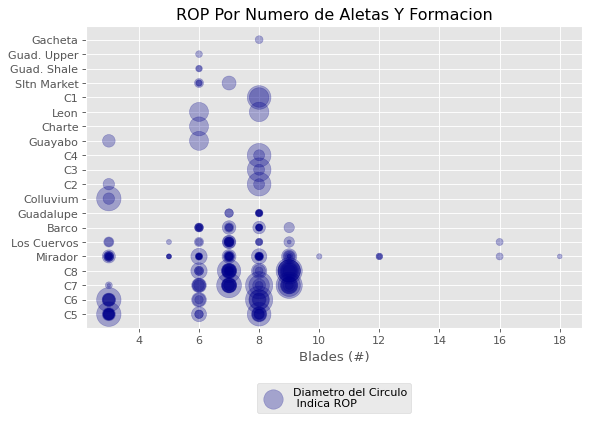

In [26]:
plt.figure(figsize=(8, 5), dpi=80)
plt.scatter(base.Blades,base.Formation,s=10*base["ROP"],c="darkblue",alpha=0.3,label="Diametro del Circulo\n Indica ROP")
plt.title('ROP Por Numero de Aletas Y Formacion')
plt.xlabel("Blades (#)")
plt.legend(loc='lower center', bbox_to_anchor=(0.5, -0.3));

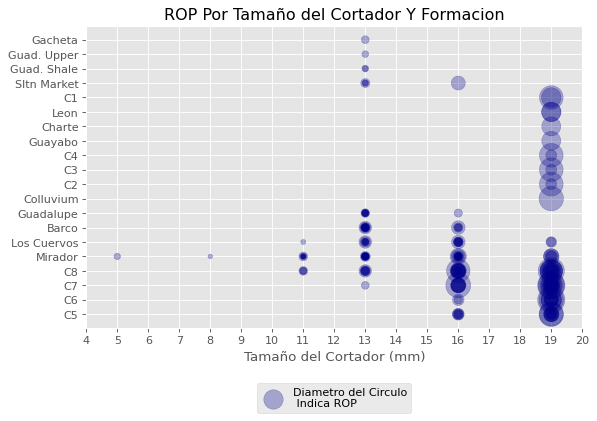

In [27]:
plt.figure(figsize=(8, 5), dpi=80)
plt.scatter(base["Cutter size"],base.Formation,s=10*base["ROP"],c="darkblue",alpha=0.3,label="Diametro del Circulo\n Indica ROP")
plt.title('ROP Por Tamaño del Cortador Y Formacion')
plt.xlabel("Tamaño del Cortador (mm)")
plt.xticks(range(0,21))
plt.xlim([4,20])
plt.legend(loc='lower center', bbox_to_anchor=(0.5, -0.3));

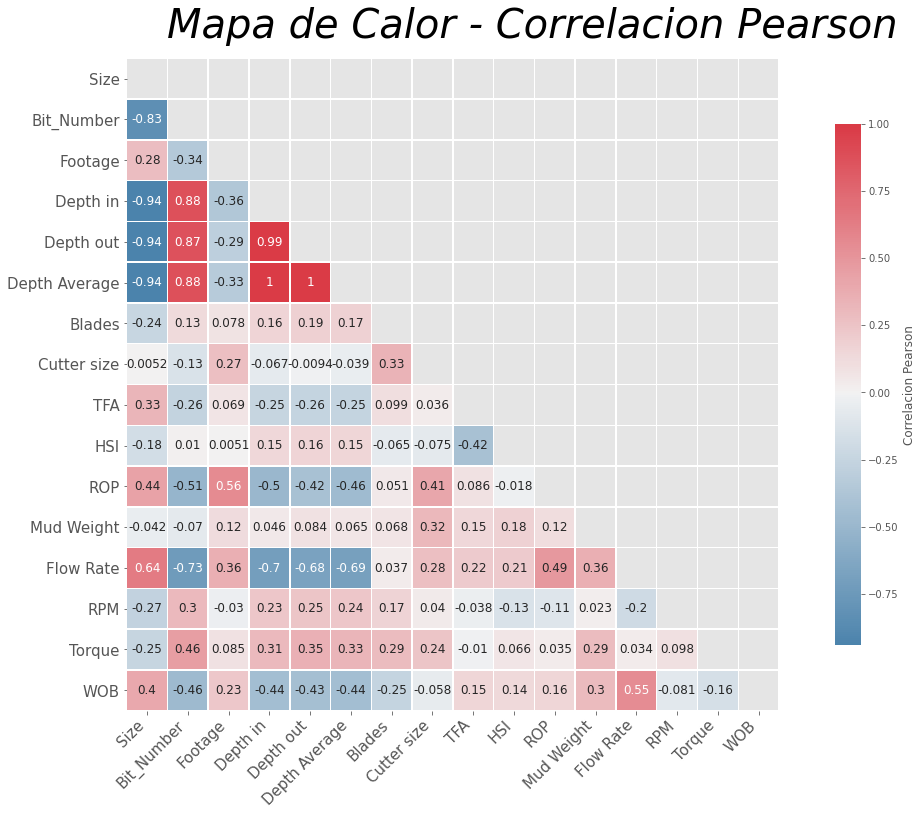

In [28]:
corr = base.corr()
mask = np.triu(np.ones_like(corr, dtype=np.bool))
f, ax = plt.subplots(figsize=(20,12))
cmap = sns.diverging_palette(240, 10, as_cmap=True)
g=sns.heatmap(corr, mask=mask, cmap=cmap, vmax=1, center=0,
            square=True, linewidths=0.5,annot=True,
            cbar_kws={"shrink": 0.8, "label":"Correlacion Pearson"},
            annot_kws={'size':12})
plt.text(1,-0.5, "Mapa de Calor - Correlacion Pearson", fontsize = 40, color='Black', fontstyle='italic')
plt.tick_params(labelsize=15)
g.set_xticklabels(g.get_yticklabels(), rotation=45, horizontalalignment='right');

In [29]:
corr_ROP=pd.DataFrame(corr[(corr["ROP"]>0.1)|(corr["ROP"]<-0.1)]["ROP"])
corr_ROP.sort_values(by="ROP",ascending=True)

,ROP
Bit_Number,-0.508984
Depth in,-0.498664
Depth Average,-0.460120
Depth out,-0.417116
RPM,-0.105793
Mud Weight,0.117936
WOB,0.158319
Cutter size,0.409101
Size,0.437572
Flow Rate,0.489565


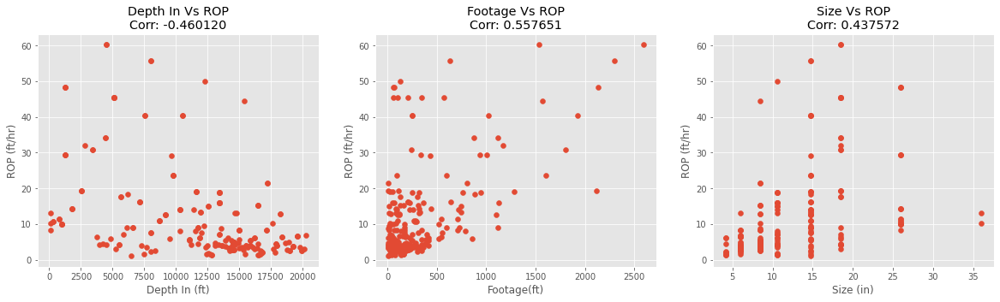

In [30]:
figure(1, figsize=(20, 5))
subplot(131)
scatter(base["Depth Average"],base["ROP"])
title("Depth In Vs ROP\nCorr: %f" %corr_ROP.loc["Depth Average"][0])
ylabel("ROP (ft/hr)")
xlabel("Depth In (ft)")

subplot(132)
scatter(base["Footage"],base["ROP"])
title("Footage Vs ROP\nCorr: %f" %corr_ROP.loc["Footage"][0])
ylabel("ROP (ft/hr)")
xlabel("Footage(ft)")

subplot(133)
scatter(base["Size"],base["ROP"])
title("Size Vs ROP\nCorr: %f" %corr_ROP.loc["Size"][0])
ylabel("ROP (ft/hr)")
xlabel("Size (in)");

Comenzaremos con las pruebas de la libreria *Pycaret*

In [31]:
reg_int = setup(data=base,
            categorical_features=["Size","Re_Run","Type","Structure","Formation","Drive_System","Manufacturer"],
            ignore_features=["Well","Bit_Number","Reference","Depth in","Depth out"],
            target="ROP",
            normalize=True,
            pca=False,
            pca_method="kernel",
            remove_outliers=True,
            feature_selection=True,
            remove_multicollinearity=False,
            feature_interaction=True,
            feature_ratio=False,
            transform_target=True,
            transform_target_method="box-cox",
            profile=False,
            polynomial_features = False,
            polynomial_degree=3,
            session_id=123
           )

 
Setup Succesfully Completed.


,Description,Value
0,session_id,123
1,Transform Target,True
2,Transform Target Method,box-cox
3,Original Data,"(212, 24)"
4,Missing Values,False
5,Numeric Features,14
6,Categorical Features,9
7,Ordinal Features,False
8,High Cardinality Features,False
9,High Cardinality Method,None


2020-12-01 11:46:04,426 - INFO     - create_model_container: 0
2020-12-01 11:46:04,427 - INFO     - master_model_container: 0
2020-12-01 11:46:04,428 - INFO     - display_container: 0
2020-12-01 11:46:04,428 - INFO     - setup() succesfully completed......................................


In [32]:
top5_int = compare_models(sort="RMSE", round = 4,n_select = 5,
                     whitelist  = ['lr',"lasso","ridge","svm","knn","dt","rf","et","ada","gbr","xgboost","lightgbm"])

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
0,Extra Trees Regressor,3.7161,62.2143,7.2789,0.5294,0.4274,0.3804,0.1157
1,Light Gradient Boosting Machine,4.3718,68.6902,7.4652,0.5604,0.4563,0.4494,0.1175
2,Gradient Boosting Regressor,4.1886,71.5340,7.6514,0.5250,0.4529,0.4248,0.1451
3,Extreme Gradient Boosting,4.1602,74.0620,7.7122,0.5062,0.4840,0.4589,0.0684
4,Random Forest,4.5770,73.0562,7.7988,0.5129,0.4601,0.4527,0.1589
5,AdaBoost Regressor,4.9083,74.8862,8.0081,0.4930,0.4751,0.4910,0.1069
6,Decision Tree,4.1825,91.5672,8.0391,0.3754,0.5297,0.4456,0.0081
7,K Neighbors Regressor,5.6695,76.5626,8.4080,0.3514,0.5265,0.6028,0.0057
8,Support Vector Machine,5.1391,88.8467,8.7442,0.4182,0.4818,0.4913,0.0082
9,Lasso Regression,7.8929,170.0862,12.2628,-0.1565,0.7698,0.8552,0.0060


2020-12-01 11:46:22,879 - INFO     - create_model_container: 5
2020-12-01 11:46:22,880 - INFO     - master_model_container: 5
2020-12-01 11:46:22,881 - INFO     - display_container: 6
2020-12-01 11:46:22,886 - INFO     - [ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=None, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=1,
                    min_samples_split=2, min_weight_fraction_leaf=0.0,
                    n_estimators=100, n_jobs=-1, oob_score=False,
                    random_state=123, verbose=0, warm_start=False), LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=31, objective

In [33]:
# tune top 5 base models
tuned_top5_int = [tune_model(i) for i in top5_int]

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,5.1502,57.0321,7.5520,0.5495,0.4732,0.4108
1,4.0445,101.6668,10.0830,0.6209,0.3436,0.1942
2,3.0044,17.6545,4.2017,0.5266,0.3308,0.3367
3,8.2930,177.0148,13.3047,0.1584,0.6905,0.5217
4,2.8074,15.5690,3.9458,0.8538,0.3092,0.3154
5,5.2907,118.9455,10.9062,0.6588,0.6321,1.1047
6,4.3479,44.9908,6.7075,0.3412,0.5352,0.6170
7,2.7278,12.7678,3.5732,0.9004,0.3643,0.4234
8,4.0184,95.6952,9.7824,0.2616,0.4209,0.2358
9,2.9524,16.9688,4.1193,0.4524,0.3794,0.3555


2020-12-01 11:47:00,981 - INFO     - create_model_container: 10
2020-12-01 11:47:00,982 - INFO     - master_model_container: 10
2020-12-01 11:47:00,983 - INFO     - display_container: 11
2020-12-01 11:47:00,985 - INFO     - RandomForestRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mae',
                      max_depth=10, max_features='log2', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=7, min_weight_fraction_leaf=0.0,
                      n_estimators=170, n_jobs=-1, oob_score=False,
                      random_state=123, verbose=0, warm_start=False)
2020-12-01 11:47:00,986 - INFO     - tune_model() succesfully completed......................................


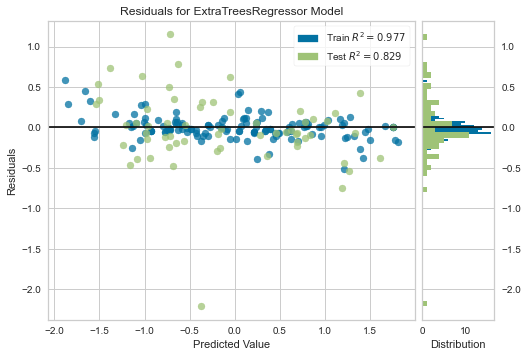

2020-12-01 11:47:03,210 - INFO     - Visual Rendered Successfully
2020-12-01 11:47:03,212 - INFO     - plot_model() succesfully completed......................................


In [34]:
plt.style.use('ggplot')
plot_model(tuned_top5_int[0])

In [35]:
tun_int = tune_model(tuned_top5_int[0])

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,4.7256,54.4654,7.3801,0.5698,0.4403,0.3855
1,3.9802,84.0225,9.1664,0.6867,0.3444,0.2356
2,2.2965,19.7398,4.4430,0.4707,0.3084,0.2605
3,8.1851,181.7562,13.4817,0.1359,0.6915,0.5262
4,2.9866,19.0902,4.3692,0.8207,0.3537,0.3568
5,4.6273,110.9065,10.5312,0.6818,0.5616,0.9018
6,3.0793,24.4945,4.9492,0.6413,0.3723,0.4202
7,2.9251,20.9182,4.5736,0.8368,0.4572,0.4742
8,3.8711,105.1729,10.2554,0.1885,0.4432,0.2003
9,3.0537,23.6422,4.8623,0.2371,0.4070,0.3605


2020-12-01 11:47:11,509 - INFO     - create_model_container: 11
2020-12-01 11:47:11,510 - INFO     - master_model_container: 11
2020-12-01 11:47:11,511 - INFO     - display_container: 12
2020-12-01 11:47:11,512 - INFO     - ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=70, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=2,
                    min_samples_split=7, min_weight_fraction_leaf=0.0,
                    n_estimators=170, n_jobs=-1, oob_score=False,
                    random_state=123, verbose=0, warm_start=False)
2020-12-01 11:47:11,513 - INFO     - tune_model() succesfully completed......................................


In [36]:
evaluate_model(tun_int)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

2020-12-01 11:47:11,661 - INFO     - Initializing interpret_model()
2020-12-01 11:47:11,664 - INFO     - interpret_model(estimator=ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=70, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=2,
                    min_samples_split=7, min_weight_fraction_leaf=0.0,
                    n_estimators=170, n_jobs=-1, oob_score=False,
                    random_state=123, verbose=0, warm_start=False), plot=summary, feature=None, observation=None)
2020-12-01 11:47:11,665 - INFO     - Checking exceptions
2020-12-01 11:47:11,775 - INFO     - Importing libraries
2020-12-01 11:47:11,777 - INFO     - plot type: summary
2020-12-01 11:47:11,778 - INFO     - Creating TreeExplainer
2020-12-01 11:47:11,792 - INFO     - Compiling shap values


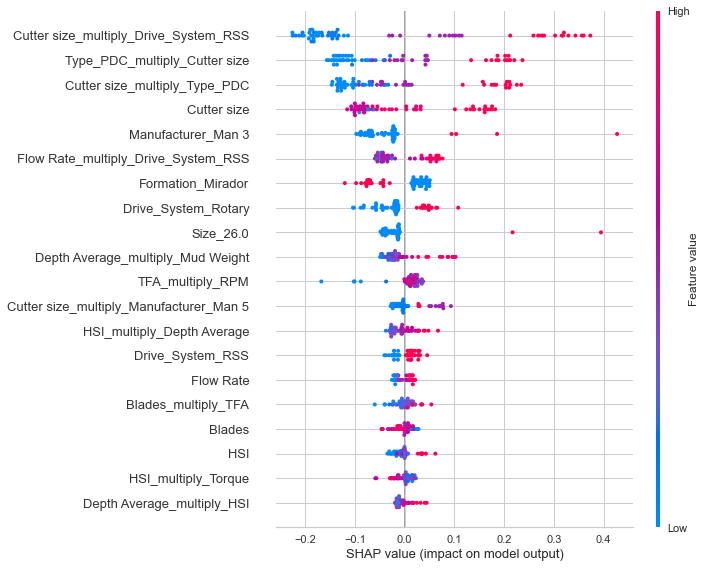

2020-12-01 11:47:12,654 - INFO     - Visual Rendered Successfully
2020-12-01 11:47:12,655 - INFO     - interpret_model() succesfully completed......................................


In [37]:
interpret_model(tun_int)

In [38]:
Mod_Fin_Pred_int=finalize_model(tun_int)

2020-12-01 11:47:12,906 - INFO     - create_model_container: 11
2020-12-01 11:47:12,907 - INFO     - master_model_container: 11
2020-12-01 11:47:12,908 - INFO     - display_container: 12
2020-12-01 11:47:12,909 - INFO     - ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=70, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=2,
                    min_samples_split=7, min_weight_fraction_leaf=0.0,
                    n_estimators=170, n_jobs=-1, oob_score=False,
                    random_state=123, verbose=0, warm_start=False)
2020-12-01 11:47:12,910 - INFO     - finalize_model() succesfully completed......................................


In [39]:
Mod_Fin_Pred_int

ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=70, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=2,
                    min_samples_split=7, min_weight_fraction_leaf=0.0,
                    n_estimators=170, n_jobs=-1, oob_score=False,
                    random_state=123, verbose=0, warm_start=False)

In [40]:
save_model(Mod_Fin_Pred_int,'Mod_High_Pred_int')

2020-12-01 11:47:13,032 - INFO     - Initializing save_model()
2020-12-01 11:47:13,033 - INFO     - save_model(model=ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=70, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=2,
                    min_samples_split=7, min_weight_fraction_leaf=0.0,
                    n_estimators=170, n_jobs=-1, oob_score=False,
                    random_state=123, verbose=0, warm_start=False), model_name=Mod_High_Pred_int, verbose=True)
2020-12-01 11:47:13,034 - INFO     - Appending prep pipeline
2020-12-01 11:47:13,204 - INFO     - Mod_High_Pred_int.pkl saved in current working directory
2020-12-01 11:47:13,215 - INFO     - [Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=['Size', 'Re_Run',
                                       

Transformation Pipeline and Model Succesfully Saved


In [41]:
reg_2 = setup(data=base,
              categorical_features=["Size","Re_Run","Type","Structure","Formation","Drive_System","Manufacturer"],
              ignore_features=["Well","Bit_Number","Reference","Depth in","Depth out"],
              target="ROP",
              normalize=True,
              pca=False,
              pca_method="kernel",
              remove_outliers=True,
              feature_selection=True,
              remove_multicollinearity=False,
              feature_interaction=False,
              transform_target=True,
              transform_target_method="box-cox",
              profile=False,
              polynomial_features = False,
              polynomial_degree = 3,  
              session_id=123
             )

 
Setup Succesfully Completed.


,Description,Value
0,session_id,123
1,Transform Target,True
2,Transform Target Method,box-cox
3,Original Data,"(212, 24)"
4,Missing Values,False
5,Numeric Features,14
6,Categorical Features,9
7,Ordinal Features,False
8,High Cardinality Features,False
9,High Cardinality Method,None


2020-12-01 11:47:16,239 - INFO     - create_model_container: 0
2020-12-01 11:47:16,240 - INFO     - master_model_container: 0
2020-12-01 11:47:16,241 - INFO     - display_container: 0
2020-12-01 11:47:16,242 - INFO     - setup() succesfully completed......................................


In [42]:
top5_wint = compare_models(sort="R2", round = 4,n_select = 5,
                    whitelist  = ['lr',"lasso","ridge","svm","knn","dt","rf","et","ada","gbr","xgboost","lightgbm"])

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
0,Gradient Boosting Regressor,4.0791,50.7363,6.6665,0.5755,0.4305,0.4263,0.0725
1,Extra Trees Regressor,3.7786,52.7990,6.8057,0.5647,0.4191,0.4087,0.1109
2,Extreme Gradient Boosting,4.0659,65.0365,7.3888,0.4963,0.4542,0.4307,0.0653
3,Random Forest,4.5556,66.3495,7.7080,0.4838,0.4590,0.4497,0.1660
4,Light Gradient Boosting Machine,4.5089,69.1527,7.7269,0.4483,0.4593,0.4527,0.0444
5,Support Vector Machine,5.1670,85.8807,8.7383,0.4016,0.4646,0.4545,0.0068
6,AdaBoost Regressor,5.2832,78.3100,8.4533,0.3962,0.4907,0.5072,0.0823
7,K Neighbors Regressor,5.6416,80.4062,8.5593,0.3723,0.5117,0.5517,0.0051
8,Ridge Regression,5.9419,86.6782,9.2008,0.1630,0.5384,0.5588,0.0064
9,Lasso Regression,7.8929,170.0862,12.2628,-0.1565,0.7698,0.8552,0.0060


2020-12-01 11:47:31,431 - INFO     - create_model_container: 5
2020-12-01 11:47:31,431 - INFO     - master_model_container: 5
2020-12-01 11:47:31,433 - INFO     - display_container: 6
2020-12-01 11:47:31,438 - INFO     - [GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=100,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=123, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False), ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=None, max_fea

In [43]:
# tune top 5 base models
tuned_top5_wint = [tune_model(i) for i in top5_wint]

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,5.4544,64.0977,8.0061,0.4937,0.5313,0.5023
1,4.5995,144.8144,12.0339,0.4600,0.4652,0.2566
2,1.6939,5.1493,2.2692,0.8619,0.2113,0.2031
3,7.7189,150.5061,12.2681,0.2845,0.6555,0.5777
4,2.4209,16.9475,4.1167,0.8409,0.3460,0.2929
5,5.1172,116.7114,10.8033,0.6652,0.5148,0.7560
6,3.5772,36.1438,6.0120,0.4707,0.4477,0.4612
7,3.4905,21.2869,4.6138,0.8339,0.4518,0.5302
8,3.9892,50.1569,7.0822,0.6130,0.4150,0.3708
9,3.2603,21.8647,4.6760,0.2945,0.3677,0.3307


2020-12-01 11:48:02,728 - INFO     - create_model_container: 10
2020-12-01 11:48:02,729 - INFO     - master_model_container: 10
2020-12-01 11:48:02,730 - INFO     - display_container: 11
2020-12-01 11:48:02,732 - INFO     - LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.2, max_depth=30,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0,
              n_estimators=100, n_jobs=-1, num_leaves=70, objective=None,
              random_state=123, reg_alpha=0.1, reg_lambda=0.5, silent=True,
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0)
2020-12-01 11:48:02,734 - INFO     - tune_model() succesfully completed......................................


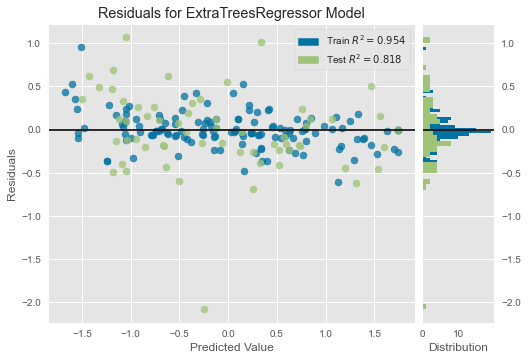

2020-12-01 11:48:03,504 - INFO     - Visual Rendered Successfully
2020-12-01 11:48:03,505 - INFO     - plot_model() succesfully completed......................................


In [44]:
plt.style.use('ggplot')
plot_model(tuned_top5_wint[1])

In [45]:
tun_wint = tune_model(tuned_top5_wint[1])

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,5.6282,65.5647,8.0972,0.4821,0.5019,0.4367
1,3.7315,74.0733,8.6066,0.7238,0.3137,0.2191
2,2.3475,19.5351,4.4199,0.4762,0.3027,0.2552
3,8.0583,163.6448,12.7924,0.2220,0.6164,0.4946
4,2.8890,17.7909,4.2179,0.8329,0.3496,0.3398
5,4.5244,91.3174,9.5560,0.7380,0.5949,1.0493
6,3.5125,34.7028,5.8909,0.4918,0.3860,0.3607
7,3.3747,19.2780,4.3907,0.8496,0.4481,0.5379
8,3.6930,75.6672,8.6987,0.4161,0.3742,0.2296
9,3.5565,36.2966,6.0247,-0.1712,0.4504,0.4369


2020-12-01 11:48:09,005 - INFO     - create_model_container: 11
2020-12-01 11:48:09,006 - INFO     - master_model_container: 11
2020-12-01 11:48:09,007 - INFO     - display_container: 12
2020-12-01 11:48:09,008 - INFO     - ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=70, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=2,
                    min_samples_split=7, min_weight_fraction_leaf=0.0,
                    n_estimators=170, n_jobs=-1, oob_score=False,
                    random_state=123, verbose=0, warm_start=False)
2020-12-01 11:48:09,010 - INFO     - tune_model() succesfully completed......................................


In [46]:
evaluate_model(tun_wint)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

2020-12-01 11:48:09,140 - INFO     - Initializing interpret_model()
2020-12-01 11:48:09,141 - INFO     - interpret_model(estimator=ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=70, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=2,
                    min_samples_split=7, min_weight_fraction_leaf=0.0,
                    n_estimators=170, n_jobs=-1, oob_score=False,
                    random_state=123, verbose=0, warm_start=False), plot=summary, feature=None, observation=None)
2020-12-01 11:48:09,142 - INFO     - Checking exceptions
2020-12-01 11:48:09,143 - INFO     - Importing libraries
2020-12-01 11:48:09,145 - INFO     - plot type: summary
2020-12-01 11:48:09,146 - INFO     - Creating TreeExplainer
2020-12-01 11:48:09,156 - INFO     - Compiling shap values


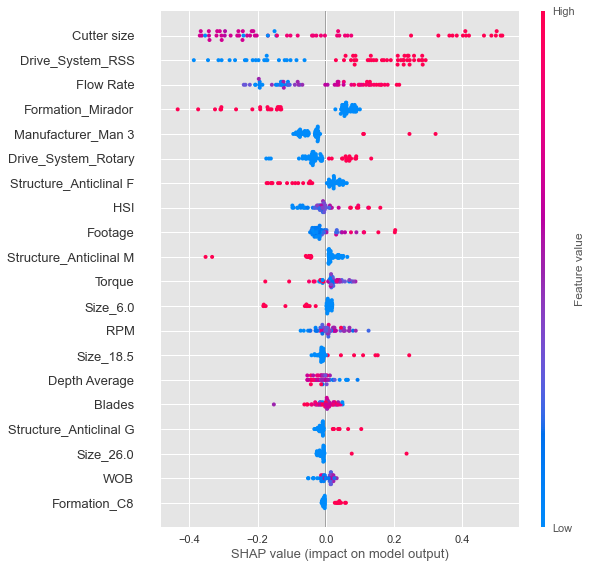

2020-12-01 11:48:09,869 - INFO     - Visual Rendered Successfully
2020-12-01 11:48:09,871 - INFO     - interpret_model() succesfully completed......................................


In [47]:
interpret_model(tun_wint)

In [48]:
Mod_Fin_wint=finalize_model(tun_wint)

2020-12-01 11:48:10,063 - INFO     - create_model_container: 11
2020-12-01 11:48:10,064 - INFO     - master_model_container: 11
2020-12-01 11:48:10,065 - INFO     - display_container: 12
2020-12-01 11:48:10,067 - INFO     - ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=70, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=2,
                    min_samples_split=7, min_weight_fraction_leaf=0.0,
                    n_estimators=170, n_jobs=-1, oob_score=False,
                    random_state=123, verbose=0, warm_start=False)
2020-12-01 11:48:10,068 - INFO     - finalize_model() succesfully completed......................................


In [49]:
save_model(Mod_Fin_wint,'Mod_Fin_wint')

2020-12-01 11:48:10,077 - INFO     - Initializing save_model()
2020-12-01 11:48:10,079 - INFO     - save_model(model=ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=70, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=2,
                    min_samples_split=7, min_weight_fraction_leaf=0.0,
                    n_estimators=170, n_jobs=-1, oob_score=False,
                    random_state=123, verbose=0, warm_start=False), model_name=Mod_Fin_wint, verbose=True)
2020-12-01 11:48:10,080 - INFO     - Appending prep pipeline
2020-12-01 11:48:10,173 - INFO     - Mod_Fin_wint.pkl saved in current working directory
2020-12-01 11:48:10,204 - INFO     - [Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=['Size', 'Re_Run',
                                                 

Transformation Pipeline and Model Succesfully Saved


In [50]:
Mod_Fin_wint = load_model('Mod_Fin_wint')

Mod_Fin_wint

Transformation Pipeline and Model Sucessfully Loaded


[Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=['Size', 'Re_Run',
                                                             'Type', 'Structure',
                                                             'Formation',
                                                             'Drive_System',
                                                             'Manufacturer'],
                                       display_types=True,
                                       features_todrop=['Well', 'Bit_Number',
                                                        'Reference', 'Depth in',
                                                        'Depth out'],
                                       ml_usecase='regression',
                                       numerical_features=[], target='ROP',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imput...
         

In [51]:
Data = pd.DataFrame( {"Size": "8.5",
                    "Type": "PDC",
                    "Structure": "Anticlinal F",
                    "Formation": "Mirador",
                    "Footage": (10500-10000),
                    "Blades" : 8,
                    "Depth Average": (10500+10000)/2,
                    "Cutter size": 13,
                    "Min Flow Rate":500,
                    "Max Flow Rate": 600,
                    "TFA": 1.1,
                    "HSI": 1.1,
                    "Min WOB": 30,
                    "Max WOB": 50,
                    "Mud Weight": 12,
                    "Drive_System": "RSS",
                    "Min_RPM": 60,
                    "Max_RPM": 120,
                    "Torque Max": 35,
                    "Torque Min": 15,
                    "Manufacturer": "Manufacturer 4",
                    "Re_Run" : "N"},
                    index=[0]
                    )

Data["Flow Rate"] = Data[["Min Flow Rate","Max Flow Rate"]].mean(axis=1)
Data["RPM"] = Data[["Min_RPM","Max_RPM"]].mean(axis=1)
Data["Torque"] = Data[["Torque Min","Torque Max"]].mean(axis=1)
Data["WOB"] = Data[["Min WOB","Max WOB"]].mean(axis=1)

Data=Data.drop(["Min Flow Rate","Max Flow Rate","Min_RPM","Max_RPM","Torque Min","Torque Max","Min WOB","Max WOB"],axis=1)

In [52]:
lr_pred_new = predict_model(Mod_Fin_wint, data = Data)

In [53]:
lr_pred_new["Label"][0]

3.8201

In [54]:
# Definicion del Grid

Size=[8.5]
Type=["PDC"]
Structure=["Anticlinal P"]
Formation=["Mirador"]
Footage=[200]
Blades = [11]
Depth_Average=[15000]
Cutter_size=[11]
Flow_Rate= range(300,1220,10)
TFA = [4] 
HSI = [3]
WOB = range(10,75,5)
Mud_Weight=[11]
Drive_System=["RSS"]
RPM = range(20,205,5) 
Torque = range(5,65,5)
Manufacturer=["Man 5"]
Re_Run=["N"]

Data_exp_1=pd.DataFrame(list(product(Size,Type,Structure,Formation,Footage,Blades,Depth_Average,Cutter_size,TFA,HSI,Mud_Weight,Drive_System,Manufacturer,Re_Run,Flow_Rate,RPM,Torque,WOB)),
                 columns=["Size","Type","Structure","Formation","Footage","Blades","Depth Average","Cutter size","TFA","HSI","Mud Weight","Drive_System","Manufacturer","Re_Run","Flow Rate","RPM","Torque","WOB"])

Data_exp_1 # Primeras cinco filas

,Size,Type,Structure,Formation,Footage,Blades,Depth Average,Cutter size,TFA,HSI,Mud Weight,Drive_System,Manufacturer,Re_Run,Flow Rate,RPM,Torque,WOB
0,8.5,PDC,Anticlinal P,Mirador,200,11,15000,11,4,3,11,RSS,Man 5,N,300,20,5,10
1,8.5,PDC,Anticlinal P,Mirador,200,11,15000,11,4,3,11,RSS,Man 5,N,300,20,5,15
2,8.5,PDC,Anticlinal P,Mirador,200,11,15000,11,4,3,11,RSS,Man 5,N,300,20,5,20
3,8.5,PDC,Anticlinal P,Mirador,200,11,15000,11,4,3,11,RSS,Man 5,N,300,20,5,25
4,8.5,PDC,Anticlinal P,Mirador,200,11,15000,11,4,3,11,RSS,Man 5,N,300,20,5,30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
531019,8.5,PDC,Anticlinal P,Mirador,200,11,15000,11,4,3,11,RSS,Man 5,N,1210,200,60,50
531020,8.5,PDC,Anticlinal P,Mirador,200,11,15000,11,4,3,11,RSS,Man 5,N,1210,200,60,55
531021,8.5,PDC,Anticlinal P,Mirador,200,11,15000,11,4,3,11,RSS,Man 5,N,1210,200,60,60
531022,8.5,PDC,Anticlinal P,Mirador,200,11,15000,11,4,3,11,RSS,Man 5,N,1210,200,60,65


In [55]:
Data_exp_1.shape

(531024, 18)

Categorizaremos los tipos de roca segun su valor de FZI:

|     Parameter     |       Value       |
|:-----------------:|:-----------------:|
|       Size        |       8 1/2       |
|       Type        |        PDC        |
|     Structure     |    Anticlinal P   |
|     Formation     |      Mirador      |
|      Footage      |       200 ft      |
|       Blades      |         11        |
|   Depth_Average   |     15,000 ft     |
|    Cutter Size    |        11 mm      |
|     Flow Rate     |range(300,1220,10) |
|        TFA        |       4 in2       |
|        HSI        |     3 hp/in2      |
|        WOB        |  range(10,75,5)   |
|     Mud Weight    |      11 ppg       |
|    Drive System   |        RSS        |
|        RPM        |  range(20,205,5)  |
|      Torque       |   range(5,65,5)   |
|   Manufacturer    |       Man 3       |
|       Re Run      |         N         |

In [56]:
lr_pred_new = predict_model(Mod_Fin_wint, data = Data_exp_1)

In [57]:
lr_pred_new.Label.max()

5.5962

In [60]:
def malla(lr_pred_new,var_1,val_1,var_2,val_2):
    
    var = ["WOB", "RPM", "Torque","Flow Rate"]
    
    var.remove(var_1)
    var.remove(var_2)
    
    tab_plot=lr_pred_new.loc[(lr_pred_new[var_1] == val_1)&(lr_pred_new[var_2] == val_2)]
    Tabla_1=tab_plot.pivot(index=var[0],columns=var[1],values="Label")
    
    fig, ax = plt.subplots(figsize=(15,7))
    
    ax=sns.heatmap(Tabla_1,xticklabels=5,yticklabels=3,cmap="seismic", ax=ax,cbar=True,
                   vmin=lr_pred_new.Label.min(),vmax=lr_pred_new.Label.max(),
                   cbar_kws={"shrink": 1, "label":" ROP (ft/hr)","orientation": "vertical"},
                   annot_kws={'size':10}
           )

    title = "Curva de Nivel ROP"
    subtitle = "Parametros Fijos\n"+var_1 + "= "+str(val_1) + " & "+var_2 + "= "+str(val_2)
    plt.title(title,fontsize=25,x=0.5,y=1.1)    
    plt.suptitle(subtitle,fontsize=15,x=0.44,y=0.95)
    ax.tick_params(labelsize=15)

    ax.invert_yaxis()
    
    x = Tabla_1.columns.values
    y = Tabla_1.index.values
    z = Tabla_1.values

    fig = go.Figure(data=[go.Surface(z=z, x=x, y=y,colorscale="RdBu_r",
                                     cmin=lr_pred_new.Label.min(),cmax=lr_pred_new.Label.max())])
    
    fig.update_layout(scene = dict(
                        xaxis_title=var[1],
                        yaxis_title=var[0],
                        zaxis_title='ROP'),
                      title={'text': "ROP (ft/ht)",'y':0.9,'x':0.5,'xanchor': 'center','yanchor': 'top'},
                      width=800, height=600,
                      margin=dict(l=65, r=50, b=65, t=90)
                     )
    fig.show()
        
    return

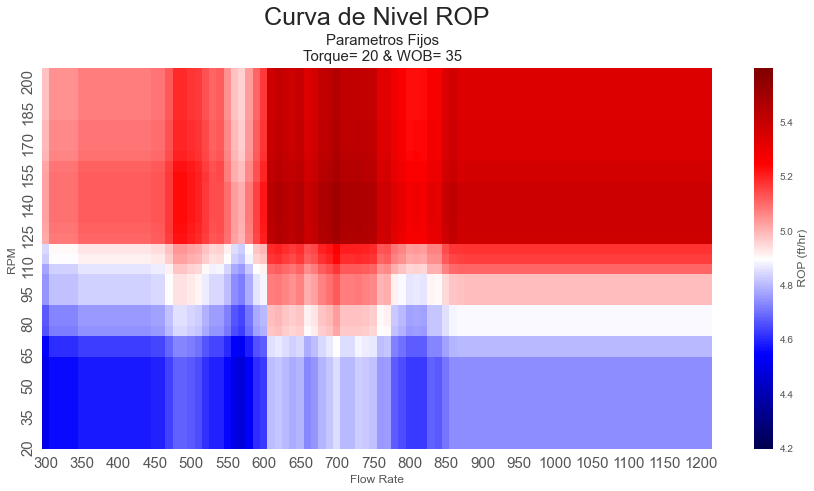

In [61]:
malla(lr_pred_new,"Torque",20,"WOB",35)